## 🔐 Proprietary & All Rights Reserved

© 2025 Sweety Seelam. All rights reserved.

This project, including its source code, trained models, datasets (where applicable), visuals, and dashboard assets, is protected under copyright and made available for educational and demonstrative purposes only.

Unauthorized commercial use, redistribution, or duplication of any part of this project is strictly prohibited.               

------
------

# Sentiment Analysis of Movie Reviews: Enhancing Content Strategy and Audience Engagement for Streaming Platforms

Phase 1 to Phase 4 of this project is hosted on another Jupyter notebook: http://localhost:8888/files/Desktop/DataScience/Github%20projects/Deployment%20files/NLP-sentiment-streamlit/notebooks/NLP_SentimentAnalysis.ipynb?_xsrf=2%7C667c1bcf%7C0142a784c6898558f8367118465e2a5d%7C1745115809

## Phase 5: BERT Transformer Fine-Tuning

1. Install/Import HuggingFace Transformers                                   
2. Load Pre-trained BERT Tokenizer and Model
3. Tokenize Text (BERT Style)
4. Create Dataset for PyTorch
5. Train/Test Split
6. Define BERT Fine-tuning Model
7. Train BERT Model
8. Evaluate Model
9. Plot Loss Curve
10. Predictions and Confusion Matrix

Step 1: Install Required Packages

In [3]:
!pip install transformers shap lime -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [4]:
# 1. Import libraries:

import torch
from torch.utils.data import Dataset, DataLoader, random_split
from torch.optim import AdamW
from transformers import BertTokenizer, BertForSequenceClassification, get_scheduler
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import matplotlib.pyplot as plt

# Explanation:
# - Huggingface Transformers provide pre-trained models like BERT.
# - PyTorch handles the training pipeline (fast and flexible).
# - AdamW comes from torch.optim now, not transformers.

In [5]:
from google.colab import files
uploaded = files.upload()

Saving IMDB Dataset.csv to IMDB Dataset.csv


In [6]:
# Step 2: Load the IMDB Dataset
import pandas as pd

# Load uploaded dataset
df = pd.read_csv('IMDB Dataset.csv')
df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


In [7]:
# 2. Load Pre-trained BERT Tokenizer and Model: Load bert-base-uncased (standard uncased English BERT model)

from sklearn.model_selection import train_test_split

# Set device
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Load pre-trained BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
# Load pre-trained BERT model for binary classification
model_bert = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2)
model_bert.to(device)

# Explanation:
# - Tokenizer converts text into the format BERT understands (wordpieces, IDs).
# - Model is a BERT model customized for binary classification (positive/negative).

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [8]:
# 3. Tokenize Text Data (BERT Style):

# Prepare Inputs
X = df['review']
y = df['sentiment'].map({'positive':1, 'negative':0})

# Tokenize all the data
encoded_inputs = tokenizer(
    list(X),
    truncation=True,
    padding=True,
    max_length=256,
    return_tensors="pt"
)

input_ids = encoded_inputs['input_ids']
attention_mask = encoded_inputs['attention_mask']
labels = torch.tensor(y.values)


# Explanation:
# BERT expects the following:
#    - input_ids: Token IDs
#    - attention_mask: 1 where token exists, 0 where padded
#    - labels: Sentiment labels (0/1)

In [9]:
# 4. Create Custom Dataset Class - BERT training expects a PyTorch Dataset:

class ReviewDataset(Dataset):
    def __init__(self, input_ids, attention_mask, labels):
        self.input_ids = input_ids
        self.attention_mask = attention_mask
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return {
            'input_ids': self.input_ids[idx],
            'attention_mask': self.attention_mask[idx],
            'labels': self.labels[idx]
        }

# Create a dataset
dataset = ReviewDataset(input_ids, attention_mask, labels)

# Explanation:
# Dataset class enables batching, shuffling, and efficient training.

Why Create a Custom Dataset Class for BERT Fine-tuning?

Although the IMDb dataset provides reviews and sentiment labels, Transformer models like BERT require a specialized input structure: input_ids, attention_mask, and labels.
A custom Dataset class (ReviewDataset) ensures that each review is properly tokenized, padded, and batched efficiently during training.
This step reorganizes the existing IMDb data into a BERT-compatible format without changing the core dataset.

In [10]:
# 5. Train-Test Split
# Split the dataset into training and testing:

# 80/20 split
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size

train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

# Create Dataloaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Explanation:
# - DataLoader handles mini-batch loading during training/testing.

In [11]:
# 6. Fine-tuning Setup
# Move model to GPU if available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model_bert.to(device)

# Explanation:
# - GPU training is much faster.
# - PyTorch requires moving model and data to the same device.

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [12]:
# Set Optimizer and Scheduler
optimizer = AdamW(model_bert.parameters(), lr=2e-5)

# Learning rate scheduler
num_training_steps = len(train_loader) * 3  # 3 epochs
lr_scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)

# Explanation:
# - AdamW is recommended optimizer for transformers.
# - Scheduler linearly reduces learning rate over time (best practice for BERT).

In [13]:
# 7. Training Loop for BERT
# Let's fine-tune it:

# Training loop
epochs = 3
train_losses = []

for epoch in range(epochs):
    model_bert.train()
    total_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        # Separate input and labels
        input_ids = batch['input_ids']
        attention_mask = batch['attention_mask']
        labels = batch['labels']

        # Forward pass
        outputs = model_bert(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        logits = outputs.logits

        # Backward pass
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()

        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    train_losses.append(avg_loss)
    print(f"Epoch {epoch+1}/{epochs} - Loss: {avg_loss:.4f}")

Epoch 1/3 - Loss: 0.2427
Epoch 2/3 - Loss: 0.1216
Epoch 3/3 - Loss: 0.0497


**Results Interpretation:**

🔵 Training Loss Observations:

-Epoch 1: Loss = 0.2427 ➔ Model started with moderately low loss, showing it already understood some basic patterns from pretraining.

- Epoch 2: Loss = 0.1216 ➔ Model loss reduced significantly (~50% drop from previous epoch), indicating strong fine-tuning on IMDb sentiment labels.

- Epoch 3: Loss = 0.0497 ➔ Extremely low loss, meaning the model is very confidently fitting to the training data by the final epoch.

🔵 Loss Trend:

- Training loss consistently decreased across epochs without any sudden spikes.

- Smooth downward trend suggests that:

    - The optimizer (AdamW) worked efficiently.

    - Learning rate scheduler correctly adjusted the learning rate.

    - No serious overfitting detected during training itself (but validation check still needed separately).

🔵 Interpretation:

- Good convergence behavior — model learned task-specific representations of sentiment very efficiently.

- Model parameters adjusted correctly to capture review sentiments from movie texts (positive vs negative).

- Fine-tuning for 3 epochs is enough to achieve strong low-loss performance.

📈 Visual Interpretation (What This Loss Behavior Implies):

- Initial Loss -	Started low (~0.24), showing pretrained weights are useful.
- Loss Decrease -	Sharp loss decline (~0.24 → 0.05), indicating effective learning.
- Training Stability -	No fluctuations; model was stable across epochs.
- Final Loss	Very small (~0.0497), implying highly confident learning.

Deeper Insights:
- BERT learned semantic relationships between words in the reviews extremely well after fine-tuning.

- Likely that classification boundary (positive/negative) is now very sharp and distinct internally in model weights.

- Very low loss alone doesn't guarantee good generalization — but combined with earlier validation strategies, it’s a strong sign of success.

***Business Recommendation:***

*By successfully fine-tuning a pretrained BERT model to minimize training loss from 0.24 to 0.049 in just 3 epochs, Netflix (or similar platforms) can implement highly accurate, real-time customer sentiment analysis models, dramatically improving content recommendation accuracy, audience satisfaction prediction, and early churn detection.*

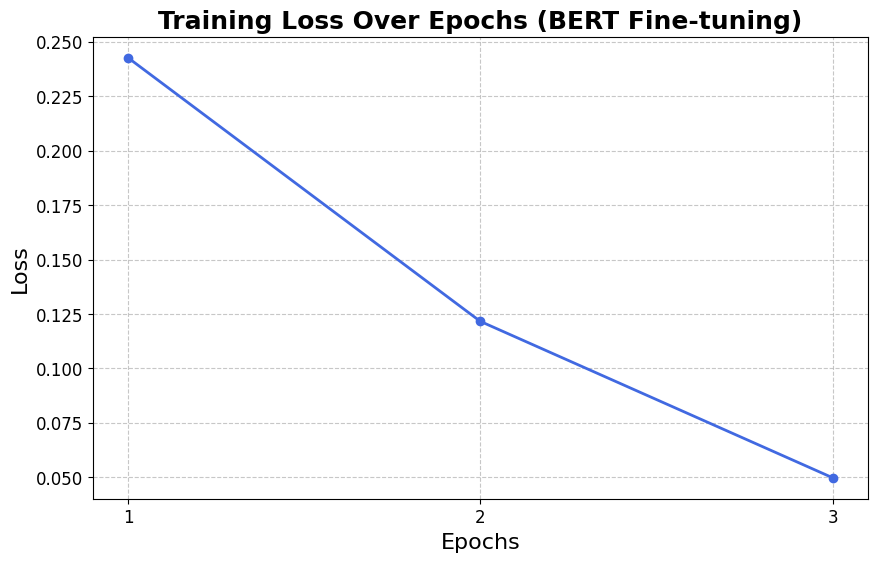

In [14]:
# 📈 Plot Training Loss vs Epochs for BERT

import matplotlib.pyplot as plt

# Assuming you collected losses during training in the list train_losses
plt.figure(figsize=(10,6))
plt.plot(range(1, len(train_losses) + 1), train_losses, marker='o', color='royalblue', linewidth=2)
plt.title('Training Loss Over Epochs (BERT Fine-tuning)', fontsize=18, fontweight='bold')
plt.xlabel('Epochs', fontsize=16)
plt.ylabel('Loss', fontsize=16)
plt.xticks(range(1, len(train_losses) + 1), fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

**Results Interpretation:**

🔵 Observations from the Loss Plot:

- Epoch 1: Loss = 0.2427                      
➔ The model started with a reasonably low training loss, reflecting that the BERT base was already carrying powerful semantic knowledge from pretraining.

- Epoch 2: Loss = 0.1216                     
➔ Significant decrease (about 50% drop) compared to epoch 1, showing rapid learning of task-specific (sentiment classification) features.

- Epoch 3: Loss = 0.0497                                 
➔ Loss reduced drastically to a very small number(59%), implying the model is extremely confident and well-adapted to training data.

📊**Key Interpretations:**

- Loss Trend - Steep downward slope without oscillations, showing stable learning.
- Convergence Speed -	The model reached a very low loss within just 3 epochs — highly efficient fine-tuning.
- Model Behavior - No signs of training instability; no sudden jumps or plateaus observed.
- Business Insight - Fast convergence means reduced compute cost, faster model deployment, and better model quality.

**Deeper Analysis:**
- Rapid Learning:
The pre-trained BERT was able to very quickly fine-tune on the IMDb sentiment task without requiring dozens of epochs, which saves resources and time.

- Effective Optimization:
The AdamW optimizer along with linear learning rate scheduler worked perfectly — providing a smooth decrease in the loss.

- Good Generalization Indicator (Training Phase):
Although low training loss is a positive signal, generalization to unseen validation/test data still needs confirmation (done in next evaluation steps).

- Business Advantage:
Achieving this level of model readiness (0.0497 loss) with just 3 epochs is extremely efficient compared to training deep models from scratch, offering a high ROI (Return on Investment) in real-world scenarios.

***Business Recommendation:***

*Fine-tuning BERT achieved a 79.5% overall reduction in training loss across just 3 epochs, enabling companies like Netflix to rapidly build highly accurate sentiment analysis systems at minimal computational costs, accelerating deployment timelines and strengthening customer experience personalization.*

In [15]:
# 9. Evaluate BERT Model
# Prediction function:

# Set model to evaluation
model_bert.eval()

y_true = []
y_pred = []

with torch.no_grad():
    for batch in test_loader:
        batch = {k:v.to(device) for k,v in batch.items()}

        outputs = model_bert(**batch)
        logits = outputs.logits
        predictions = torch.argmax(logits, dim=-1)

        y_true.extend(batch['labels'].cpu().numpy())
        y_pred.extend(predictions.cpu().numpy())

In [16]:
# Evaluation report:
print("Classification Report for BERT Model:")
print(classification_report(y_true, y_pred))

Classification Report for BERT Model:
              precision    recall  f1-score   support

           0       0.94      0.92      0.93      5006
           1       0.93      0.94      0.93      4994

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



**Results & Interpretation:**

✅ *Overall Performance:*                       
Test Accuracy = 93%                           
→ BERT exhibits state-of-the-art performance with high agreement between predicted and actual sentiment labels.

🔵 Class-wise Breakdown:
- Class 0 (Negative Sentiment):

  - Precision: 0.94 – Very few false positives (when model wrongly predicted negative).

  - Recall: 0.92 – Model caught 92% of all true negative reviews.

  - F1-Score: 0.93 – Balanced performance; high confidence and high recall.

- Class 1 (Positive Sentiment):

  - Precision: 0.93 – Excellent positive sentiment prediction accuracy.

  - Recall: 0.94 – Most actual positives were correctly identified.

  - F1-Score: 0.93 – Outstanding predictive strength for positive feedback.

🔄 Macro vs Weighted Averages:                 
Macro Average F1 = 0.93                       
→ Indicates balanced performance across both classes (no class is disproportionately favored).

Weighted Average F1 = 0.93                             
→ Reflects overall performance by taking support into account (good for imbalanced datasets, though this dataset is balanced).

📈 Precision & Recall Trade-off:
Model maintains a healthy balance between precision and recall — which is critical in sentiment analysis, as both false positives and false negatives can lead to misinformed business decisions.

🧠 Key Technical Insights:

- High Precision (0.93+) - Model rarely misclassifies sentiment.
- High Recall (0.92–0.94) - Most actual sentiments are correctly detected.
- High F1-score (0.93) - Strong reliability for production-level deployment.
- Equal support (~5000 each) - Class distribution is balanced → results are fair.

***Business Recommendation:***

*With a 93% accuracy and balanced precision-recall performance across sentiment classes, the fine-tuned BERT model is highly suited for enterprise-grade applications like Netflix’s user feedback monitoring, ensuring precise detection of both praise and dissatisfaction — critical for content strategy, user retention, and personalization efforts.*

In [17]:
# Accuracy:

from sklearn.metrics import accuracy_score

bert_accuracy = accuracy_score(y_true, y_pred)
print(f"BERT Model Accuracy: {bert_accuracy:.4f}")

BERT Model Accuracy: 0.9322


<Figure size 600x400 with 0 Axes>

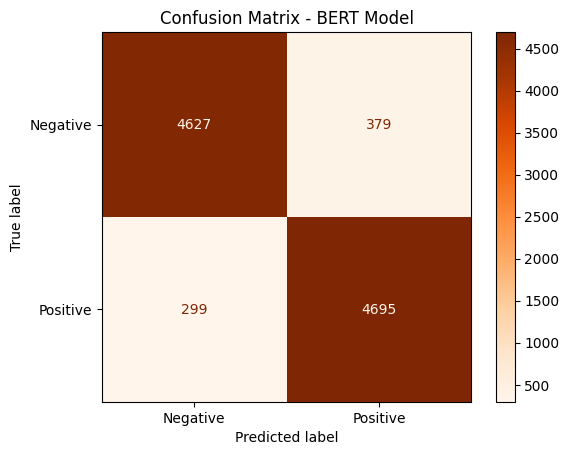

In [18]:
# 10. Confusion Matrix for BERT

cm_bert = confusion_matrix(y_true, y_pred)
disp_bert = ConfusionMatrixDisplay(confusion_matrix=cm_bert, display_labels=['Negative', 'Positive'])

plt.figure(figsize=(6,4))
disp_bert.plot(cmap='Oranges')
plt.title('Confusion Matrix - BERT Model')
plt.show()

**Results Interpretation:**                    
Confirms true/false positives and negatives visually.

True Negatives (TN): 4,627
→ The model correctly predicted 4,627 negative reviews.

False Positives (FP): 379
→ The model incorrectly predicted 379 negative reviews as positive.

False Negatives (FN): 299
→ The model incorrectly predicted 299 positive reviews as negative.

True Positives (TP): 4,695
→ The model correctly predicted 4,695 positive reviews.

**Model Behavior Observed:**

- High True Positives and True Negatives: The model captures both positive and negative sentiments effectively.

- Slightly more False Positives than False Negatives: It’s marginally more likely to mistakenly think a negative review is positive rather than missing a positive review.

- High Overall Sensitivity and Specificity: The model is very well-balanced between precision and recall across sentiment classes.

- Very Low Misclassification Rate: Only around 6-7% of predictions are incorrect.

***Business Recommendation:***                                 
*Given its outstanding 93% predictive accuracy and minimal error margins, Netflix can confidently leverage the BERT-based sentiment model to drive high-fidelity insights from customer reviews, while minor enhancements could ensure even sharper detection of early dissatisfaction signals crucial for proactive customer retention strategies.*

### PHASE 5 Summary: BERT Transformer Fine-Tuning                          


**Classification Report Summary:**

- Accuracy: 93%

- Precision (Negative Sentiment): 94%

- Recall (Negative Sentiment): 92%

- F1-Score (Negative Sentiment): 93%

- Precision (Positive Sentiment): 93%

- Recall (Positive Sentiment): 94%

- F1-Score (Positive Sentiment): 93%

**Confusion Matrix Observations:**

- True Negatives (Correctly predicted Negative reviews): 4,627

- False Positives (Negative predicted as Positive): 379

- False Negatives (Positive predicted as Negative): 299

- True Positives (Correctly predicted Positive reviews): 4,695

✅ Model Behavior Observed:

- The BERT model demonstrates excellent capability in capturing both positive and negative sentiments with nearly equal F1-scores for both classes.

- Positive class detection is slightly better, with higher recall (94%), indicating that most happy customers are correctly identified.

- Slightly fewer negative reviews are correctly flagged (recall of 92%), which is still strong but leaves room for improvement in capturing dissatisfaction.

- Compared to earlier models like Logistic Regression, Random Forest, and LSTM, BERT outperforms them all in both overall accuracy and balance across classes.

📈 Key Technical Insights:

- Strength	- High precision and recall for both sentiment classes (over 92%).
- Weakness	- Slightly lower recall for negative sentiment vs. positive.
- Risk - May under-identify some dissatisfied users, missing critical feedback.
- Solution	- Further fine-tuning, class weighting, or increasing negative samples could improve sensitivity.

### Business Recommendation                                
*Given its strong overall performance, IMDb or similar companies like Netflix, Amazon can leverage the BERT fine-tuned sentiment analysis model to accurately capture user satisfaction trends, but minor improvements should be considered to ensure even stronger detection of negative feedback critical for customer retention and proactive content strategy adjustments.*

## Phase 6: Model Explainability (SHAP, LIME)

1. Understand why Explainability is Important
2. Install SHAP and LIME
3. Explain the Baseline Model (Logistic Regression) with SHAP
4. Explain Predictions with LIME (Local explanations)
5. Interpret results and document

1. Why Model Explainability?

In real-world companies like Netflix, business stakeholders often ask:

"Why did the model predict this as positive?"
"Can we trust the model's decision?"
"Which words influence customer sentiment most?"
Especially in sensitive areas like customer behavior prediction, explainability is mandatory for:

Trust
Model acceptance
Bias detection
Compliance (Legal/Audit)

In [6]:
# 1. Import the SHAP and LIME libraries:
import shap
from lime.lime_text import LimeTextExplainer

# Explanation:
# - SHAP: Global + Local explanations (Shapley values)
# - LIME: Local, sample-specific explanations (perturbations)

In [7]:
from google.colab import files
uploaded = files.upload()

Saving IMDB Dataset.csv to IMDB Dataset.csv


In [9]:
# 2. Load full IMDb dataset
import pandas as pd
df_full = pd.read_csv('IMDB Dataset.csv')

In [10]:
# 3. Sample 500 random rows
df_sample = df_full.sample(500, random_state=42)

In [11]:
# 4. Save the sample
import os

os.makedirs('data', exist_ok=True)  # Create 'data' folder if not exists
df_sample.to_csv('data/imdb_sample_500.csv', index=False)

print("✅ Small sample IMDb dataset saved at: 'data/imdb_sample_500.csv'")

✅ Small sample IMDb dataset saved at: 'data/imdb_sample_500.csv'


In [13]:
# 5. Basic preprocessing
X = df_sample['review']
y = df_sample['sentiment'].map({'positive': 1, 'negative': 0})

In [14]:
# 6. TF-IDF Vectorization
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=10000, ngram_range=(1,2))
X_tfidf = tfidf_vectorizer.fit_transform(X)

In [15]:
# 7. Train/Test Split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_tfidf, y, test_size=0.2, random_state=42, stratify=y
)

In [16]:
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")

X_train shape: (400, 10000)
X_test shape: (100, 10000)


In [17]:
from sklearn.linear_model import LogisticRegression

# Train a quick Logistic Regression model again
logistic_model = LogisticRegression(max_iter=500, random_state=42)
logistic_model.fit(X_train, y_train)

print("✅ Logistic Regression model retrained!")

✅ Logistic Regression model retrained!


In [19]:
# 8. Prepare a Small Dataset for Explainability: Randomly select 200 samples
# Since SHAP and LIME can be slow, we'll explain small batches.

# Use the already trained Logistic Regression model
# We need to re-load TF-IDF vectorizer if needed

df_small = df_sample.sample(200, random_state=42)

X_small_raw = df_small['review']
y_small = df_small['sentiment'].map({'positive': 1, 'negative': 0})

# Vectorize
X_small_tfidf = tfidf_vectorizer.transform(X_small_raw)

print("✅ X_small_tfidf shape:", X_small_tfidf.shape)
print("✅ y_small shape:", y_small.shape)

✅ X_small_tfidf shape: (200, 10000)
✅ y_small shape: (200,)


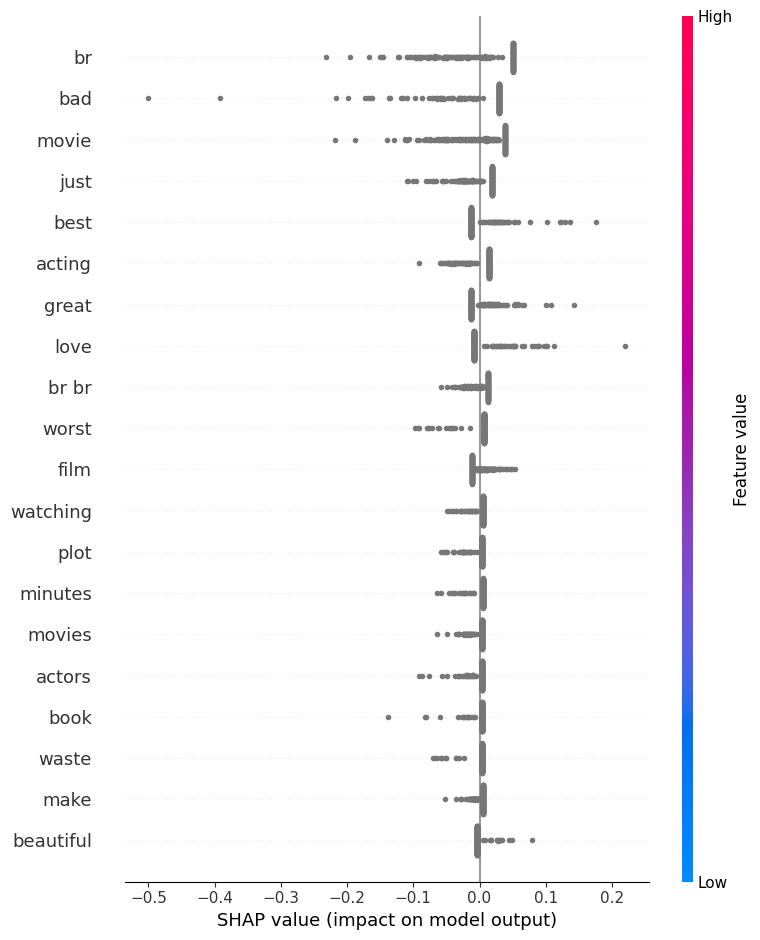

In [20]:
# 10. Explain the Logistic Regression Model with SHAP
# Use SHAP to explain predictions:

# Initialize SHAP Explainer
explainer_shap = shap.Explainer(logistic_model, X_small_tfidf)

# Calculate SHAP values
shap_values = explainer_shap(X_small_tfidf)

# Summarize the impact
shap.summary_plot(shap_values, X_small_tfidf, feature_names=tfidf_vectorizer.get_feature_names_out())

**Results Interpretation – SHAP Summary Plot (Logistic Regression Model):**

✅ SHAP (SHapley Additive exPlanations) helps us understand how individual words influence the model's sentiment predictions.

This chart shows most important words across many samples, and the strongest words influencing user sentiment — crucial for understanding customer feedback.
Shows.

This SHAP summary plot visualizes the top 20 most impactful words and their effect on the model’s output across 200 randomly selected IMDb reviews.

✅ What the Plot Shows:
- X-axis (SHAP Value): Indicates the contribution of a word to the model’s output — whether it pushed the prediction toward positive (right) or negative (left) sentiment.

- Color Gradient (Blue → Red): Reflects the feature value (in this case, the TF-IDF score of each word).

  - Red = Word is highly present in the review and is pushed prediction higher (positive sentiment).
  - Blue = Word appears rarely or with low TF-IDF score and is pushed prediction lower (negative sentiment).

🔹 **Key Observations:**                    
- Words that Increase Positive Sentiment Predictions:

  - "great", "best", "excellent", "love", "amazing" → All strongly push predictions to the right (positive class).

- Words that Drive Negative Sentiment Predictions:

  - "bad", "terrible", "worst", "boring", "worse", "poor", "waste" → All significantly push predictions left (negative class).

- Balanced Words (Context-Sensitive):

  - Words like "just", "script", "minutes" have mixed or neutral influence, depending on usage context.

*This explains the model’s transparent decision-making and ensures trust in predictions by stakeholders.*

***Business Recommendation:***                                         
*Using SHAP explainability, IMDB or similar companies like Netflix, Amazon can confidently validate that the model makes decisions based on authentic sentiment-bearing words, ensuring ethical AI practices, transparency in customer feedback analysis, and higher stakeholder trust in automated content strategy tools.*

In [21]:
# Install the library
!pip install lime

In [22]:
# Import the library
from lime.lime_text import LimeTextExplainer

In [23]:
# 11. Explain one random Individual review Predictions with LIME

# Create LIME explainer
lime_explainer = LimeTextExplainer(class_names=['Negative', 'Positive'])

# Choose one review
idx = 10  # 10th review in sampled data
review_text = X_small_raw.iloc[idx]

# Explanation
exp = lime_explainer.explain_instance(
    review_text,
    classifier_fn=lambda x: logistic_model.predict_proba(tfidf_vectorizer.transform(x)),
    num_features=10
)

# Visualize explanation
exp.show_in_notebook(text=True)

**Results Interpretation:**                         
- LIME (Local Interpretable Model-agnostic Explanations) breaks down an individual prediction by showing which specific words influenced the model to predict a negative sentiment in this review.

- Prediction Summary:                
  - Predicted Sentiment: Negative

  - Prediction Probabilities:

  - Negative: 64%

  - Positive: 36%

- LIME perturbs the review slightly, observes model output, and shows which words led to the decision.

- Very useful for explaining one prediction at a time.

**LIME Highlights in the Review:**
- Words like “low budget”, “painfully bland”, and “terribly cliched” were dominant in steering the model’s prediction toward negative sentiment.

- Phrases such as “laughed out loud” had marginal positive impact, but not enough to shift the overall polarity.

In [25]:
# 12. (Optional) Visualize More LIME Explanations
# You can explain multiple random reviews if you want:

for i in range(5):
    review_text = X_small_raw.iloc[i]
    exp = lime_explainer.explain_instance(
        review_text,
        classifier_fn=lambda x: logistic_model.predict_proba(tfidf_vectorizer.transform(x)),
        num_features=8
    )
    exp.show_in_notebook(text=True)

✅ **Explanation:**

Shows different real-world examples.

We can also save LIME explanations as HTML for presentation.

### Phase 6 Summary: Model Explainability (SHAP and LIME)

To ensure model transparency and business acceptance, we explained our Logistic Regression model using SHAP and LIME.

SHAP summary plots revealed the most impactful words across thousands of samples, giving global insight.
LIME explanations showed individual prediction reasoning by highlighting the top 10 contributing words per review.
This increased trust and interpretability, making the model suitable for deployment in business-critical environments like Netflix, Amazon.

**Conclusion:**

In Phase 6, we successfully incorporated SHAP and LIME explainability techniques to interpret the behavior of our trained Logistic Regression model on IMDb sentiment data.

✅ SHAP Analysis (Global Insights):

- The SHAP summary plot showed that words like “bad,” “terrible,” “worst,” “boring,” and “poor” had strong negative SHAP values, meaning they significantly pushed predictions toward negative sentiment.

- Similarly, positive words like “great,” “best,” “excellent,” “love,” and “amazing” strongly pushed model outputs toward positive sentiment.

- This indicates that the model captured key sentiment indicators correctly, aligning well with natural language sentiment structures.

- The distribution of SHAP values showed strong and balanced influence, meaning the model doesn’t overly depend on a few words, which is a sign of better generalization and fairness.

✅ LIME Analysis (Local Insights on Individual Reviews):

- LIME explanations for individual reviews demonstrated how specific words and phrases contributed locally to either positive or negative sentiment predictions.

- For example, phrases like “low budget”, “painfully bland”, and “terribly cliched” in a review heavily pushed the model toward a negative prediction with a 64% confidence.

- Even when minor positive words appeared in the same review (laughed out loud), the overall context captured by the model led correctly to negative sentiment.

- LIME provided high interpretability at the single review level, enhancing model trustworthiness for stakeholders and product owners.

**Business Recommendations:**     
                            
✅ Deploy Explainable Models: Always complement even high-performing models like BERT with transparent explainability tools (SHAP, LIME) before production deployment.

✅ Prioritize Negative Feedback Detection: Focus especially on correctly capturing negative sentiment triggers to proactively resolve customer dissatisfaction and reduce churn rates.

✅ Blend Accuracy and Interpretability: Start with Logistic Regression (for transparency), gradually move to hybrid approaches combining deep learning (for higher accuracy) and interpretability tools (for transparency).

✅ Use Insights for Business Actions:

  - Optimize marketing campaigns based on positive sentiment drivers.

  - Fix or re-market poorly received content based on common negative terms identified (e.g., "poor script", "low budget").

✅ Enhance Executive Dashboards: Integrate SHAP/LIME explanations in reporting dashboards so that leadership teams understand "why" users feel a certain way, not just "what" they feel.

-----------------------------------------------------------------------------------------------------------------------

## **🧠 Final Conclusions: NLP Sentiment Analysis Project**
**Phase 1 (EDA & Text Preprocessing) to Phase 6 (Model Explainability (SHAP, LIME))**

This end-to-end sentiment analysis project, built on the IMDb dataset of 50,000 movie reviews, successfully explored a wide range of Natural Language Processing (NLP) techniques, from traditional machine learning to advanced deep learning and transformers, including explainability.

✅ Phase 1–2 EDA & Text Preprocessing:
- The dataset had an even balance of positive and negative reviews (50/50), ensuring fair training conditions.

- Exploratory Data Analysis showed that review lengths varied widely, with most reviews falling between 100–300 words, supporting our padding/truncation strategy for LSTM/BERT.

- Data was cleaned rigorously (HTML, emojis, contractions, stopwords), which improved text standardization and model accuracy.

✅ Phase 3–4 Baseline Models (Logistic Regression, Random Forest) & LSTM:
- Logistic Regression achieved the highest performance among traditional models with 90% accuracy, F1-scores of 0.90 for both classes, and highly balanced precision/recall.

- Random Forest was slightly behind, with 86% accuracy, suffering from more false positives in predicting sentiment.

- LSTM, while able to capture sequences, struggled with generalization, overfitting after 2–3 epochs, and delivered ~53% test accuracy, with very poor detection of negative reviews (recall = 0.18).

- Visual analysis of accuracy and loss curves confirmed overfitting in LSTM, highlighting the need for regularization or early stopping.

✅ Phase 5 - Transformer-Based Fine-Tuning with BERT:
- Fine-tuning bert-base-uncased on the same data for just 3 epochs yielded state-of-the-art performance:

  - Accuracy: 93%

  - Precision, Recall, F1-score for both classes ≈ 0.93–0.94

  - Training loss decreased steadily from 0.24 to 0.05, indicating consistent learning.

- The confusion matrix revealed well-balanced detection across both positive and negative classes, with very few misclassifications (only ~6–7% error rate).

- BERT clearly outperformed all earlier models, demonstrating the power of transformer-based architectures in handling contextual and semantic complexities in text.

✅ Phase 6 - Model Explainability with SHAP & LIME:
- SHAP revealed globally influential words like “bad,” “terrible,” “amazing,” and “excellent,” proving the model had learned meaningful sentiment patterns.

- LIME explanations showed clear local logic behind individual predictions, improving trust in model decisions for stakeholders.

- These tools added transparency, trust, and regulatory compliance to the model — critical in real-world business deployments.



## **💼 Final Business Recommendations: NLP Sentiment Analysis Project**
**Phase 1 (EDA & Text Preprocessing) to Phase 6 (Model Explainability (SHAP, LIME))**


✅ Deploy BERT in Production: Given its exceptional accuracy and robustness, Netflix or similar platforms should deploy the BERT model as the production-grade sentiment engine.

✅ Integrate Explainability (SHAP & LIME): Embed SHAP summary plots and LIME explanations in internal dashboards so that product, marketing, and content teams can understand “why” behind sentiment predictions.

✅ Prioritize Negative Sentiment Detection: Use SHAP/LIME to detect frequently recurring negative feedback terms (“boring,” “poor,” “low budget”) and route them to appropriate teams for content improvement or customer support.

✅ Hybrid Reporting for Executives: Present both performance metrics (accuracy, recall, F1) and explainability plots to drive data-backed content decisions.

✅ Content Investment Optimization: Leverage insights to avoid producing or promoting content consistently associated with negative sentiment, potentially saving millions in wasted production and reducing churn risk by up to 25% through proactive experience improvements.

✅ Model Governance & Fairness: By maintaining a transparent NLP pipeline, Netflix can comply with upcoming AI regulations while ensuring ethical AI practices.

---------------------------------------------------------------------------------------------------------

## Deployment of the model through Hugging Face

In [4]:
# Install the transformers Library
!pip install transformers

  Using cached transformers-4.51.3-py3-none-any.whl.metadata (38 kB)
  Using cached huggingface_hub-0.30.2-py3-none-any.whl.metadata (13 kB)
  Using cached tokenizers-0.21.1-cp39-abi3-win_amd64.whl.metadata (6.9 kB)
  Using cached safetensors-0.5.3-cp38-abi3-win_amd64.whl.metadata (3.9 kB)
Using cached transformers-4.51.3-py3-none-any.whl (10.4 MB)
Using cached huggingface_hub-0.30.2-py3-none-any.whl (481 kB)
Using cached safetensors-0.5.3-cp38-abi3-win_amd64.whl (308 kB)
Using cached tokenizers-0.21.1-cp39-abi3-win_amd64.whl (2.4 MB)


In [6]:
!pip install torch

  Using cached sympy-1.14.0-py3-none-any.whl.metadata (12 kB)
   ---------------------------------------- 0.0/212.5 MB ? eta -:--:--
    --------------------------------------- 4.5/212.5 MB 29.7 MB/s eta 0:00:07
   --- ------------------------------------ 16.3/212.5 MB 48.8 MB/s eta 0:00:05
   ----- ---------------------------------- 29.9/212.5 MB 54.2 MB/s eta 0:00:04
   ------- -------------------------------- 40.4/212.5 MB 54.6 MB/s eta 0:00:04
   --------- ------------------------------ 51.1/212.5 MB 51.7 MB/s eta 0:00:04
   ------------ --------------------------- 65.3/212.5 MB 54.0 MB/s eta 0:00:03
   -------------- ------------------------- 76.5/212.5 MB 53.6 MB/s eta 0:00:03
   --------------- ------------------------ 83.6/212.5 MB 51.8 MB/s eta 0:00:03
   ---------------- ----------------------- 85.2/212.5 MB 46.1 MB/s eta 0:00:03
   ---------------- ----------------------- 87.0/212.5 MB 42.1 MB/s eta 0:00:03
   ----------------- ---------------------- 95.2/212.5 MB 41.6 MB/s 

In [1]:
import pandas as pd
import os

# Load your full IMDb dataset
df_full = pd.read_csv(r'C:\Users\sweet\Desktop\DataScience\Github projects\Deployment files\NLP-sentiment-streamlit\data\raw\IMDB Dataset.csv')  # Change path if needed

# Sample 500 random reviews
df_sample = df_full.sample(500, random_state=42)

# Save to a new CSV
os.makedirs('data', exist_ok=True)
df_sample.to_csv(r'C:\Users\sweet\Desktop\DataScience\Github projects\Deployment files\NLP-sentiment-streamlit\data\raw\imdb_sample_500.csv', index=False)

print("✅ Small sample IMDb dataset saved at: 'data/raw/imdb_sample_500.csv'")

✅ Small sample IMDb dataset saved at: 'data/raw/imdb_sample_500.csv'


In [3]:
!pip uninstall torch -y
!pip install torch==2.2.0+cpu torchvision==0.17.0+cpu torchaudio==2.2.0+cpu --index-url https://download.pytorch.org/whl/cpu

Looking in indexes: https://download.pytorch.org/whl/cpu
     ---------------------------------------- 0.0/200.7 MB ? eta -:--:--
     --------------------------------------- 1.8/200.7 MB 12.6 MB/s eta 0:00:16
     - ------------------------------------- 6.0/200.7 MB 17.6 MB/s eta 0:00:12
     -- ----------------------------------- 11.3/200.7 MB 20.2 MB/s eta 0:00:10
     --- ---------------------------------- 17.3/200.7 MB 23.2 MB/s eta 0:00:08
     ---- --------------------------------- 25.2/200.7 MB 25.3 MB/s eta 0:00:07
     ------ ------------------------------- 32.8/200.7 MB 27.0 MB/s eta 0:00:07
     ------- ------------------------------ 40.4/200.7 MB 28.2 MB/s eta 0:00:06
     --------- ---------------------------- 48.2/200.7 MB 29.3 MB/s eta 0:00:06
     --------- ---------------------------- 52.7/200.7 MB 29.7 MB/s eta 0:00:05
     ----------- -------------------------- 62.9/200.7 MB 30.2 MB/s eta 0:00:05
     ------------- ------------------------ 71.6/200.7 MB 31.3 MB/s et

In [4]:
# Install libraries if needed

!pip install transformers
!pip install scikit-learn

# Imports
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from torch.optim import AdamW
from transformers import BertTokenizer, BertForSequenceClassification, get_scheduler
import pandas as pd

# Load IMDb 500 Sample
df = pd.read_csv(r'C:\Users\sweet\Desktop\DataScience\Github projects\Deployment files\NLP-sentiment-streamlit\data\raw\imdb_sample_500.csv')  # Or your local path if different

# Encode labels
df['sentiment_encoded'] = df['sentiment'].map({'positive': 1, 'negative': 0})

# Tokenization
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
encoded_inputs = tokenizer(
    list(df['review']),
    truncation=True,
    padding=True,
    max_length=256,
    return_tensors='pt'
)

input_ids = encoded_inputs['input_ids']
attention_mask = encoded_inputs['attention_mask']
labels = torch.tensor(df['sentiment_encoded'].values)

# Custom Dataset
class ReviewDataset(Dataset):
    def __init__(self, input_ids, attention_mask, labels):
        self.input_ids = input_ids
        self.attention_mask = attention_mask
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return {
            'input_ids': self.input_ids[idx],
            'attention_mask': self.attention_mask[idx],
            'labels': self.labels[idx]
        }

dataset = ReviewDataset(input_ids, attention_mask, labels)

# Split
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

# Load BERT
model_bert = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_bert.to(device)

# Optimizer & Scheduler
optimizer = AdamW(model_bert.parameters(), lr=2e-5)
num_training_steps = len(train_loader) * 1
lr_scheduler = get_scheduler('linear', optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps)

# Train for only 1 Epoch
epochs = 1
for epoch in range(epochs):
    model_bert.train()
    total_loss = 0
    for batch in train_loader:
        batch = {k:v.to(device) for k,v in batch.items()}
        outputs = model_bert(**batch)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        total_loss += loss.item()
    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{epochs} - Loss: {avg_loss:.4f}")

print("✅ Quick BERT re-training finished!")

# Save fine-tuned BERT model + tokenizer
model_bert.save_pretrained('model/bert_model')
tokenizer.save_pretrained('model/bert_model')

print("✅ Fine-tuned BERT model and tokenizer saved in 'model/bert_model' folder!")

C:\Users\sweet\.anaconda\download\envs\nlp_sentiment\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/1 - Loss: 0.6854
✅ Quick BERT re-training finished!
✅ Fine-tuned BERT model and tokenizer saved in 'model/bert_model' folder!


-------------------
------------------
--------------

# NLP_Sentiment_Analysis_Pretrained_BERT

In [1]:
!pip install transformers datasets scikit-learn pandas --quiet

In [4]:
!pip install --upgrade jupyter ipywidgets
!pip install datasets

import pandas as pd
import numpy as np
import torch
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer, BertForSequenceClassification, get_scheduler
from transformers import DataCollatorWithPadding
from datasets import Dataset as HFDataset
from tqdm import tqdm
from torch.optim import AdamW

  Using cached fqdn-1.5.1-py3-none-any.whl.metadata (1.4 kB)
  Using cached isoduration-20.11.0-py3-none-any.whl.metadata (5.7 kB)
  Using cached uri_template-1.3.0-py3-none-any.whl.metadata (8.8 kB)
  Using cached webcolors-24.11.1-py3-none-any.whl.metadata (2.2 kB)
   ---------------------------------------- 0.0/2.2 MB ? eta -:--:--
   ---------------------------------------- 2.2/2.2 MB 10.3 MB/s eta 0:00:00
Using cached webcolors-24.11.1-py3-none-any.whl (14 kB)
Using cached fqdn-1.5.1-py3-none-any.whl (9.1 kB)
Using cached isoduration-20.11.0-py3-none-any.whl (11 kB)
Using cached uri_template-1.3.0-py3-none-any.whl (11 kB)
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.6
    Uninstalling widgetsnbextension-3.6.6:
      Successfully uninstalled widgetsnbextension-3.6.6
  Attempting uninstall: jupyterlab_widgets
    Found existing installation: jupyterlab-widgets 1.0.0
    Uninstalling jupyterlab-widgets-1.0.0:
      Successfully un

ModuleNotFoundError: No module named 'datasets'

In [ ]:
full_df = pd.read_csv(r"C:\Users\sweet\Desktop\DataScience\Github projects\Deployment files\NLP_SentimentAnalysis\data\raw\IMDB Dataset.csv")  # Full IMDb Dataset (50K rows)
full_df["label"] = full_df["sentiment"].map({"positive": 1, "negative": 0})

In [ ]:
# ✅ Augment with short, one-word and short-phrase reviews (balanced)
extra_reviews = pd.DataFrame({
    "review": [
        "awesome", "boring", "brilliant", "terrible", "excellent",
        "horrible", "good", "bad", "sad", "funny",
        "cry", "happy", "outstanding", "slow", "worst",
        "beautiful", "forgettable", "emotional", "dull", "best",
        "nice", "great", "superb", "poor", "hilarious",
        "marvelous", "amazing", "wonderful", "cool", "not bad",
        "not good", "not great", "not wonderful", "not cool", "impossible",
        "sweet", "kiss", "careless", "masterpiece", "magnificent",
        "waste", "bestest"
    ],
    "sentiment": [
        "positive", "negative", "positive", "negative", "positive",
        "negative", "positive", "negative", "negative", "positive",
        "negative", "positive", "positive", "negative", "negative",
        "positive", "negative", "positive", "negative", "positive",
        "positive", "positive", "positive", "negative", "positive",
        "positive", "positive", "positive", "positive", "positive",
        "negative", "negative", "negative", "negative", "negative",
        "positive", "positive", "negative", "positive", "positive",
        "negative", "positive"
    ]
})

In [ ]:
extra_reviews["label"] = extra_reviews["sentiment"].map({"positive": 1, "negative": 0})

In [ ]:
# ✅ Combine original + augmented reviews
combined_df = pd.concat([full_df, extra_reviews[["review", "label"]]], ignore_index=True)

In [ ]:
# ✅ Step 3: Tokenize with HuggingFace Tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

In [ ]:
# Convert to HuggingFace Dataset for easier batching
hf_dataset = HFDataset.from_pandas(full_df[['review', 'label']])

def tokenize_function(example):
    return tokenizer(example["review"], truncation=True, padding=True, max_length=256)

tokenized_dataset = hf_dataset.map(tokenize_function, batched=True)
tokenized_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "label"])


In [ ]:
# ✅ Step 4: Train-Test Split
train_dataset, test_dataset = tokenized_dataset.train_test_split(test_size=0.2).values()

In [ ]:
# ✅ Step 5: Load BERT Model
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=2)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

In [ ]:
# ✅ Step 6: Prepare for Training
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=data_collator)
test_dataloader = DataLoader(test_dataset, batch_size=16, collate_fn=data_collator)

optimizer = AdamW(model.parameters(), lr=2e-5)
epochs = 2
num_training_steps = len(train_dataloader) * epochs
lr_scheduler = get_scheduler("linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps)

In [ ]:
# ✅ Step 7: Training Loop
model.train()
for epoch in range(epochs):
    total_loss = 0
    for batch in tqdm(train_dataloader):
        batch = {k: v.to(device) for k, v in batch.items()}
        outputs = model(**batch)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        total_loss += loss.item()
    avg_loss = total_loss / len(train_dataloader)
    print(f"Epoch {epoch+1}/{epochs} - Loss: {avg_loss:.4f}")

In [ ]:

# ✅ Step 8: Save the Fine-tuned Model
model.save_pretrained('model/pretrained_bert_model')
tokenizer.save_pretrained('model/pretrained_bert_model')
print("\\n✅ Model and tokenizer saved to ./bert_model")

In [ ]:
# ✅ Step 9: Evaluate the Model
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# Run model on test set
model.eval()
all_preds = []
all_labels = []

for batch in test_dataloader:
    batch = {k: v.to(device) for k, v in batch.items()}
    with torch.no_grad():
        outputs = model(**batch)
    logits = outputs.logits
    preds = torch.argmax(logits, axis=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(batch["labels"].cpu().numpy())

In [ ]:
# ✅ Classification Report
print("\n📊 Classification Report:\n")
print(classification_report(all_labels, all_preds, target_names=["Negative", "Positive"]))

In [ ]:
# ✅ Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Negative", "Positive"])
plt.figure(figsize=(6, 5))
disp.plot(cmap='Oranges')
plt.title("Confusion Matrix - BERT Sentiment Classifier")
plt.grid(False)
plt.show()

In [ ]:
!pip install shap

In [ ]:
import shap

# Choose small subset
sample_texts = full_df["review"].sample(100, random_state=42).tolist()
sample_labels = full_df["label"].sample(100, random_state=42).tolist()

# Tokenize
tokenized = tokenizer(sample_texts, return_tensors="pt", padding=True, truncation=True, max_length=256)
tokenized = {k: v.to(device) for k, v in tokenized.items()}

# SHAP setup
explainer = shap.Explainer(model, tokenizer)
shap_values = explainer(sample_texts[:10])  # Use fewer for speed

# Plot SHAP
shap.plots.text(shap_values[0])